# Recap

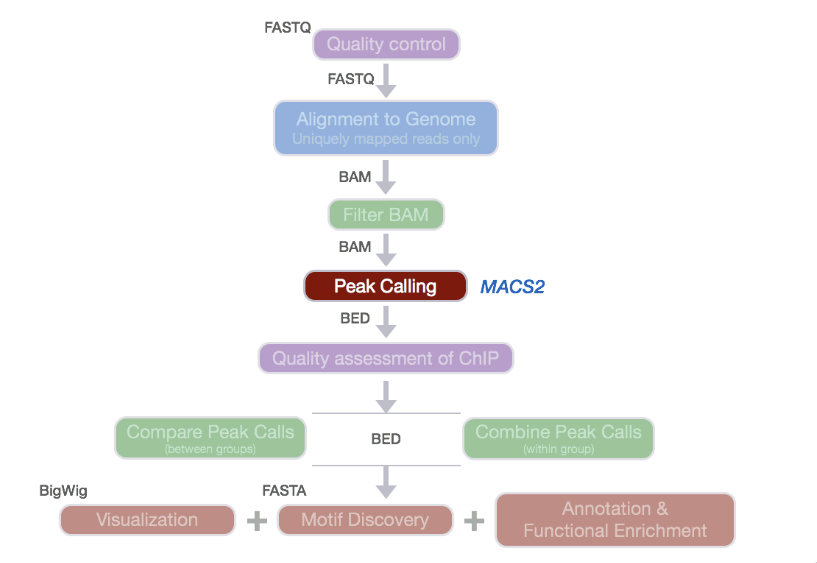

# Motif Analysis

Create a motif analysis directory and link your ChIP-seq/ATAC-seq/scATAC results (so peaks or differentially accessible regions)

In [1]:
mkdir -p /mnt/storage/$USER/jupyternotebooks/motif_analysis
cd /mnt/storage/$USER/jupyternotebooks/motif_analysis

TF ChIP-seq

In [2]:
ln -sf /mnt/storage/u0160030/jupyternotebooks/chipseq/*.bed ./

Histone ChIP-seq

In [3]:
ln -sf /mnt/storage/u0160030/jupyternotebooks/histone_chipseq/*.bed ./

Bulk ATAC-seq

In [4]:
ln -sf /mnt/storage/u0160030/jupyternotebooks/atacseq/p53_dox/*.bed ./

scATAC DARs

In [5]:
ln -sf /mnt/storage/data/teaching_regenomics/DARs_pycistopic_cell_type/*.bed ./

Let's check the directory with all of them now

In [3]:
ls *.bed

ls: cannot access '*.bed': No such file or directory


: 2

## 1. De novo motif discovery

Run RSAT [peak-motifs](https://rsat.france-bioinformatique.fr/teaching/peak-motifs_form.cgi) at the RSAT website https://rsat.france-bioinformatique.fr/teaching/

Here is a tutorial for RSAT peak-motifs: https://rsat.france-bioinformatique.fr/teaching/tutorials/tut_peak-motifs.html

Background information about position-specific scoring matrices (PSSM) is here: https://rsat.france-bioinformatique.fr/teaching/tutorials/tut_PSSM.html

Before running peak-motifs, you need as input the <b>FASTA sequences of the peaks</b>. How to get these?
Some options: 

1. Use retrieve sequences from BED format in RSAT https://rsat.france-bioinformatique.fr/teaching/retrieve-seq-bed_form.cgi (or fetch-sequences from UCSC https://rsat.france-bioinformatique.fr/teaching/fetch-sequences_form.php).
2. Use MEME suite BED2FASTA tool https://meme-suite.org/meme/tools/bed2fasta.
3. UCSC Table Browser (first make a custom track of your peak BED file)
4. Command-line (e.g., using BEDTools: bedtools getfasta -fi 'genome FASTA' -bed 'input BED')

Example of retrieving the sequences from the BED file using BEDTools

In [10]:
bedtools getfasta -h 


Tool:    bedtools getfasta (aka fastaFromBed)
Version: v2.26.0
Summary: Extract DNA sequences from a fasta file based on feature coordinates.

Usage:   bedtools getfasta [OPTIONS] -fi <fasta> -bed <bed/gff/vcf>

Options: 
	-fi	Input FASTA file
	-bed	BED/GFF/VCF file of ranges to extract from -fi
	-name	Use the name field for the FASTA header
	-split	given BED12 fmt., extract and concatenate the sequencesfrom the BED "blocks" (e.g., exons)
	-tab	Write output in TAB delimited format.
		- Default is FASTA format.

	-s	Force strandedness. If the feature occupies the antisense,
		strand, the sequence will be reverse complemented.
		- By default, strand information is ignored.

	-fullHeader	Use full fasta header.
		- By default, only the word before the first space or tab is used.



: 1

Find the genome fasta (for your assembly) in the resources directory

In [10]:
bedtools getfasta -fi /mnt/storage/data/resources/hg19/hg19.fa -bed CHD8_peaks.bed -fo CHD8_peaks.fasta

WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000191_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000191_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr7_gl000195_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr7_gl000195_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr7_gl000195_random) was not 

In [9]:
bedtools getfasta -fi /mnt/storage/data/resources/hg19/hg19.fa -bed TRRAP_peaks.bed -fo TRRAP_peaks.fasta

WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr17_gl000205_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000191_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000191_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000191_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr1_gl000192_random) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr7_gl000195_random) was n

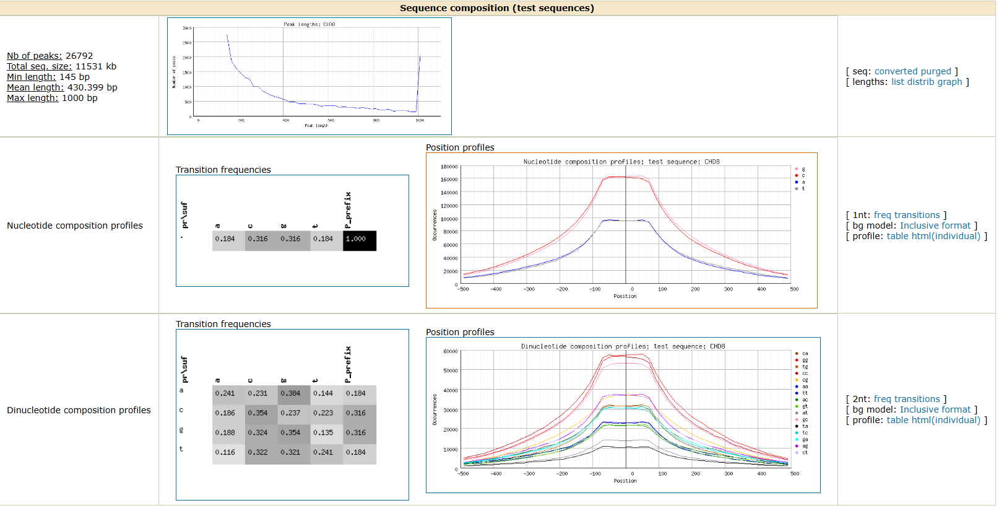

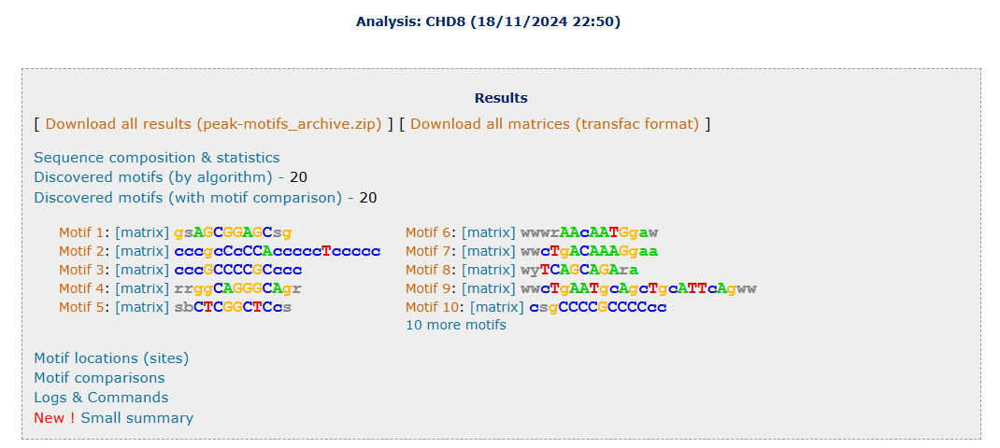

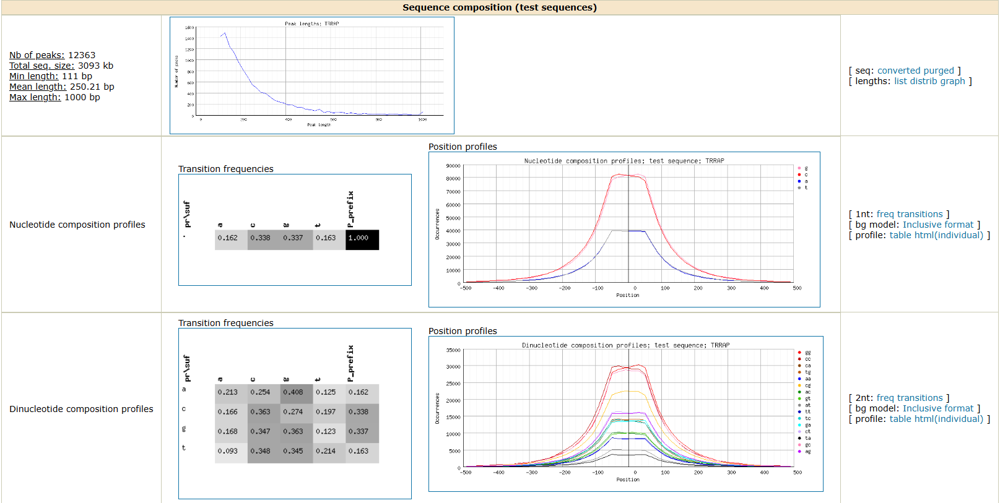

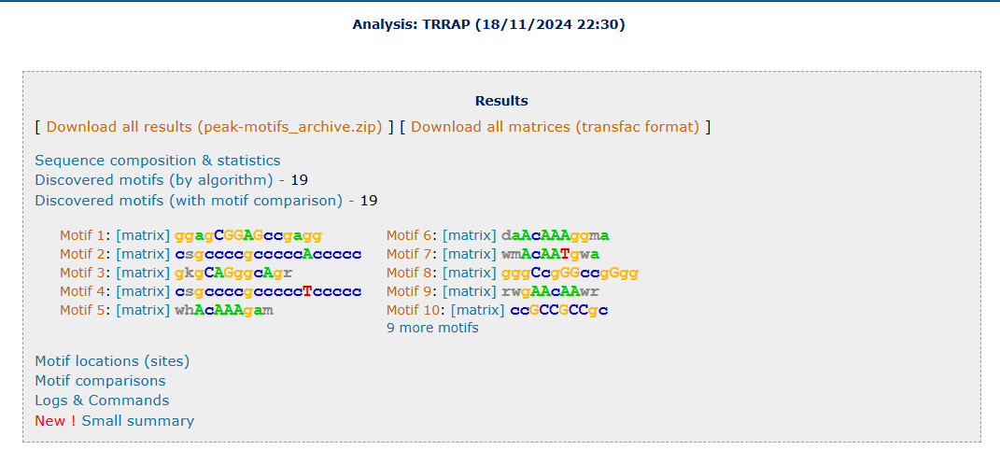

Here is the first part of the RSAT peak-motifs output (full results here https://rsat.france-bioinformatique.fr/teaching/tmp/www-data/2024/10/25/peak-motifs.2024-10-25.164905_2024-10-25.164905_MXjLBA/peak-motifs_synthesis.html) : the sequence composition

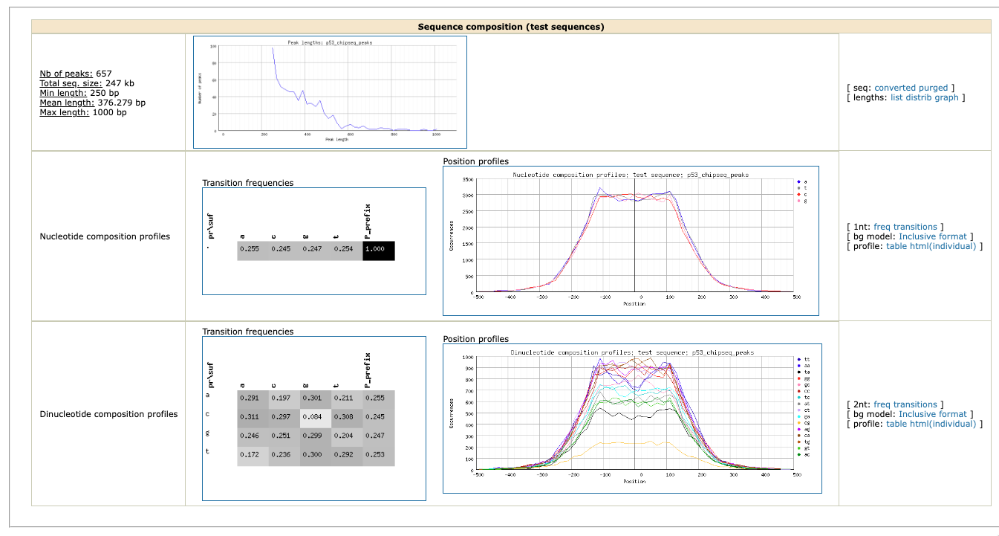

### Create a BED file with only the DIRECT peaks = peaks with the TP53 motif

473 peaks have a predicted site, you can download these by clicking on the "sites" link on the RSAT results page.

Check the file

In [4]:
head -n 2 peak-motifs_oligos_6nt_mkv3_m1_sites.tab

; matrix-scan  -quick -v 1 -seq_format fasta -i $RSAT/public_html/tmp/apache/2023/10/23/peak-motifs.2023-10-23.110539_2023-10-23.110539_p0I275/data/sequences/peak-motifs_test_maxlen1000.fasta -matrix_format transfac -m $RSAT/public_html/tmp/apache/2023/10/23/peak-motifs.2023-10-23.110539_2023-10-23.110539_p0I275/results/discovered_motifs/oligos_6nt_mkv3_m1/peak-motifs_oligos_6nt_mkv3_m1.tf -bg_format inclusive -bgfile $RSAT/public_html/tmp/apache/2023/10/23/peak-motifs.2023-10-23.110539_2023-10-23.110539_p0I275/results/composition/peak-motifs_test_inclusive-1str-ovlp_2nt.txt -pseudo 1 -2str -decimals 1 -bg_pseudo 0.01 -n score -lth score 7.5 -origin center -offset 0 -return sites -o $RSAT/public_html/tmp/apache/2023/10/23/peak-motifs.2023-10-23.110539_2023-10-23.110539_p0I275/results/discovered_motifs/oligos_6nt_mkv3_m1/peak-motifs_oligos_6nt_mkv3_m1_sites.tab
; Quick counting mode           


Filter out the non-relevant lines (starting with ; and #)

In [12]:
grep -v ";" peak-motifs_oligos_6nt_mkv3_m1_sites.tab | head -n 2

#seq_id	ft_type	ft_name	strand	start	end	sequence	weight
chr1:9241975-9242475	site	oligos_6nt_mkv3_m1	R	-26	-3	TGGGCTTGCCTGGGCTTGTTCCGA	12.4
grep: write error: Broken pipe


In [13]:
grep -v ";" peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v '#' | head -n 2

chr1:9241975-9242475	site	oligos_6nt_mkv3_m1	R	-26	-3	TGGGCTTGCCTGGGCTTGTTCCGA	12.4
chr1:9241975-9242475	site	oligos_6nt_mkv3_m1	D	-24	-1	GGAACAAGCCCAGGCAAGCCCAGG	13.3
grep: write error: Broken pipe


Get the coordinate column and remove duplicates

In [16]:
grep -v ";" peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v '#' | cut -f 1 | tr "_" "\t" | awk '!a[$0]++' | head

chr1:9241975-9242475
chr1:12267182-12267459
chr1:29565827-29566077
chr1:41947946-41948333
chr1:42998891-42999259
chr1:45265364-45265888
chr1:68151923-68152662
chr1:69521038-69521317
chr1:72466481-72466903
chr1:100895861-100896309


In [17]:
cat peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v ";" | grep -v '#' | cut -f 1 | tr "_" "\t" | awk '!a[$0]++' > p53-allpeaks-with-motif-RSAT.bed

Count the peaks with the motif

In [18]:
wc -l p53-allpeaks-with-motif-RSAT.bed

473 p53-allpeaks-with-motif-RSAT.bed


## 2. PWM and track enrichment
Next to de novo motif enrichment, which we did above with RSAT, we can also ask whether the TP53 ChIP-seq peaks we found are enriched for matches to known PSSMs (PWMs) from PSSM databases like JASPAR, TRANFAC, cis-bp, HOCOMOCO, etc.

In addition, we can ask whether our peaks overlap significantly (or "correlate") with other epigenomic data sets, called "tracks". For example, histone modification ChIP-seq tracks, or chromatin accessibility tracks. Some web-based tools that do this include i-cisTarget, Enrichr, and LOLA.

i-cisTarget will test for enrichment of motifs, using a collection of databases of PSSMs, as well as tracks.

Below, we have uploaded our ChIP-seq peak file to i-cisTarget https://gbiomed.kuleuven.be/apps/lcb/i-cisTarget/. This will place your job in a queue, which can take a while (~15 min or so) to complete.

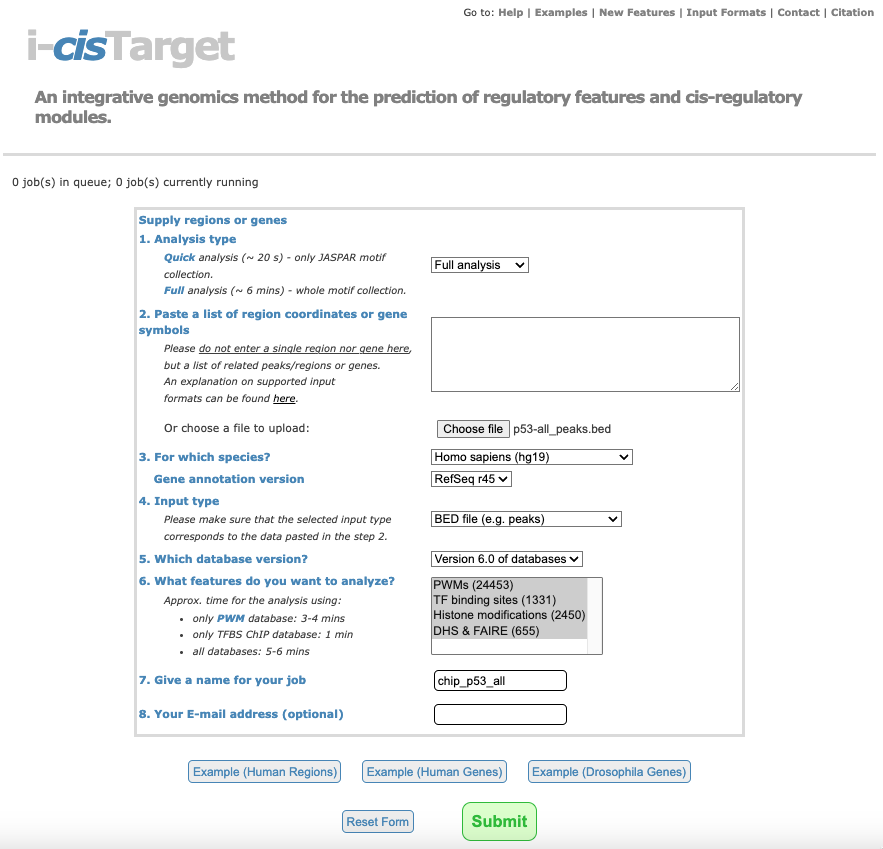

I find different different forms of E2F as the first motif.
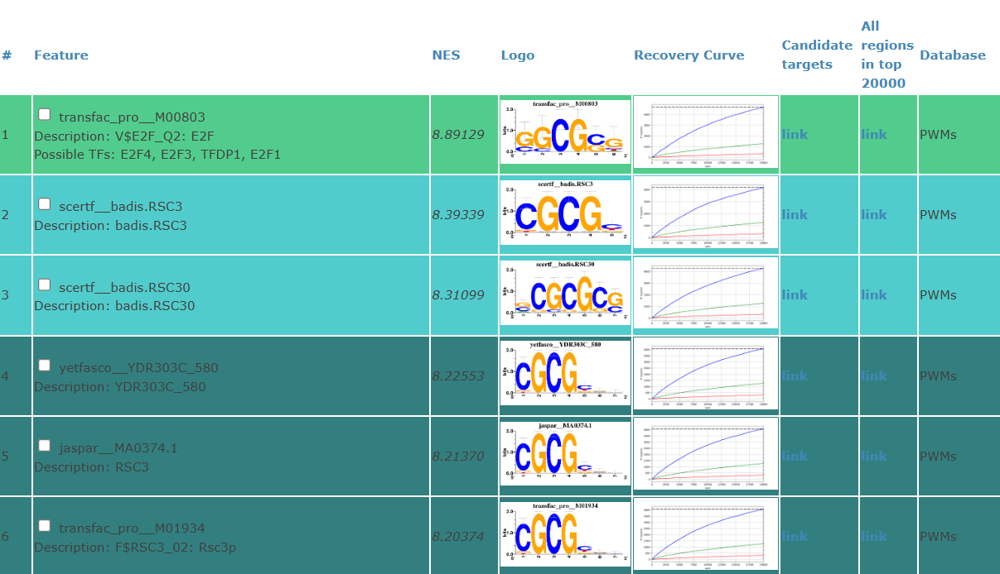

 Looking at the "recovery plot" of my input ChIP-seq peaks, ranked by motif across the genome, I can see that almost 4,400 peaks are in the leading edge out of the 14,261 input set representing 30%. 

### Leading edge in i-cisTarget for the E2F motif = directly bound regions

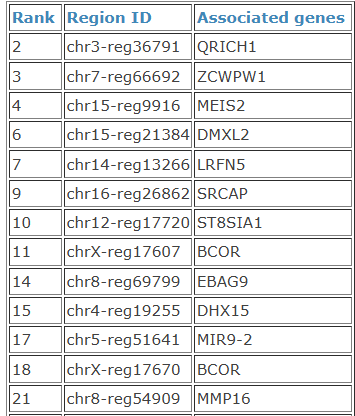

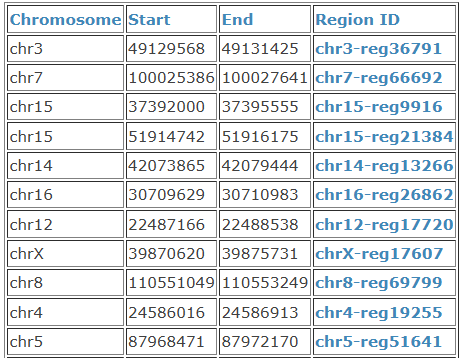

This is the link to the results:
https://gbiomed.kuleuven.be/apps/lcb/i-cisTarget/reports/c1b8ca7d35fb0e75c18a0eed5eb0c56566d08e26/report.html

We find (many variations of) the TP53 motif as the first motif, good !

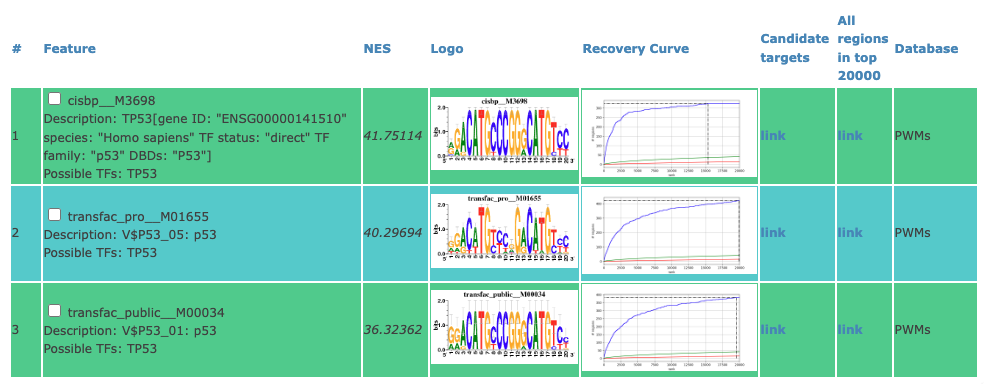

This tool also provides a "recovery plot" of your input ChIP-seq peaks, ranked by this motif across the genome. This leads to a "leading edge", similar to GSEA analysis. We see that around 325 peaks are in the leading edge, so about half of the input peaks contain a good match of the TP53 motif. 

The other peaks either have a weak TP53 motif (hard to distinguish from background), or they are indirectly bound by TP53, or they are cross-linking artifacts (i.e. phantom peaks).

The enriched tracks (white boxes without motifs) show that the TP53 ChIP-seq data is enriched, as expected (it's a positive control). Further below, among the other enriched tracks we do not find any obvious/interesting tracks.

### Leading edge in i-cisTarget for the TP53 motif = directly bound regions

Click on the link under "Candidate targets". On the page with the targets, scroll down, you will find a BED file with the regions in the leading edge, having a strong motif match.

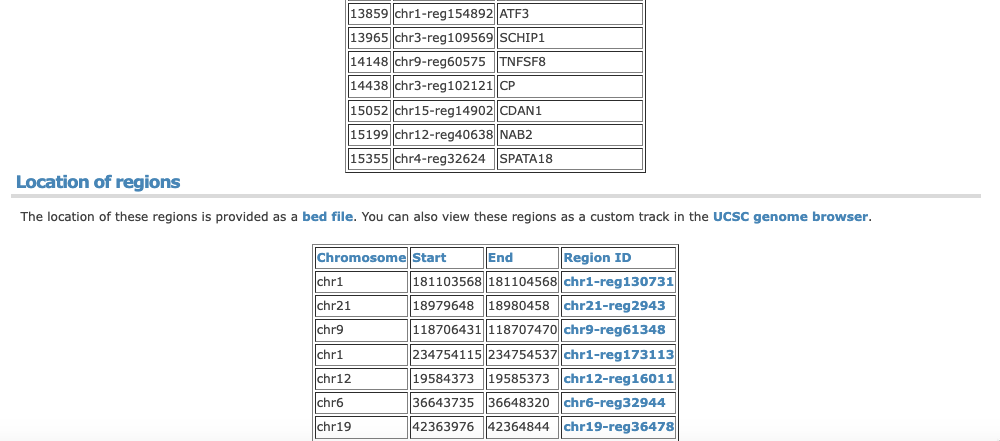

In [32]:
head TRRAP_E2F.targets.bed

track name=taipale_cyt_meth__E2F2_GCGCGCGCGYW_eDBD_repr_candidate_targets description="" useScore=1
chr12	3067085	3071235	chr12-reg3105
chr17	37025690	37026442	chr17-reg31885
chr17	40332963	40333480	chr17-reg35567
chr18	5893425	5896515	chr18-reg3499
chr6	71276707	71277498	chr6-reg53153
chr4	184825260	184827943	chr4-reg102267
chr1	89988985	89991384	chr1-reg79605
chr19	37861420	37862694	chr19-reg31814
chr2	191510900	191515515	chr2-reg128734


In [33]:
wc -l TRRAP_E2F.targets.bed

4497 TRRAP_E2F.targets.bed


# Additional Functional analysis (p53 nutlin example)

#### TRRAP SAMPLE: E2F
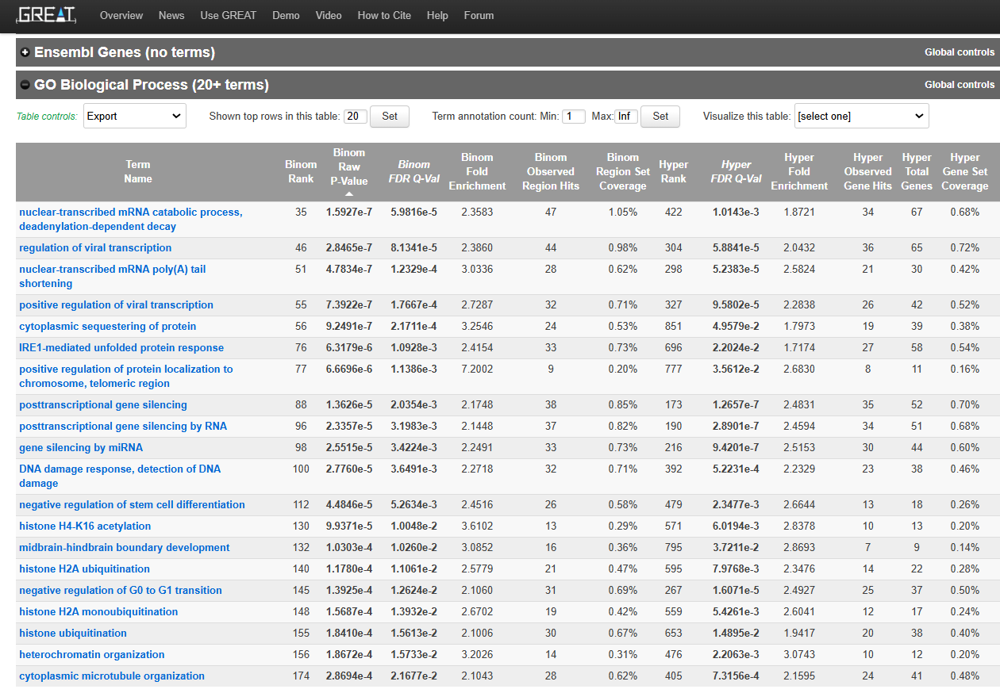

I decided to explore miRNA-mediated regulation (gene silencing by miRNA) since they are particularly interesting, as miRNAs often modulate gene networks related to autism and neural development.
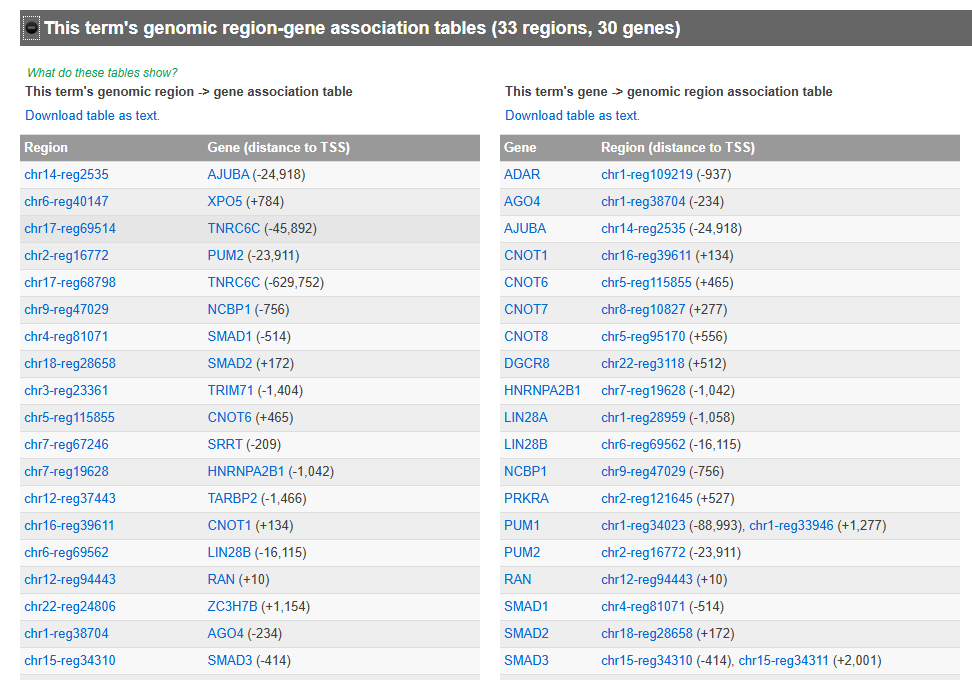

In GREAT output, in the "Job Description", we can download a table with all genes linked to all the peaks:

In [34]:
head TRRAP_E2F_gene_silencing.txt

# GREAT version 4.0.4	Species assembly: hg19	Association rule: Basal+extension: 5000 bp upstream, 1000 bp downstream, 1000000 bp max extension, curated regulatory domains included
ADAR	chr1-reg109219 (-937)
AGO4	chr1-reg38704 (-234)
AJUBA	chr14-reg2535 (-24918)
CNOT1	chr16-reg39611 (+134)
CNOT6	chr5-reg115855 (+465)
CNOT7	chr8-reg10827 (+277)
CNOT8	chr5-reg95170 (+556)
DGCR8	chr22-reg3118 (+512)
HNRNPA2B1	chr7-reg19628 (-1042)


In [36]:
cat TRRAP_E2F_gene_silencing.txt | cut -f 1 | grep -v '#' | wc -l

31


Save these genes into a text file

In [50]:
cat TRRAP_E2F_gene_silencing.txt | cut -f 1 | grep -v '#' > TRRAP-E2F-silencing-targets-GREAT.txt

### All genes related to E2F in the TRRAP sample

In [38]:
head TRRAP_E2F_all_genes.txt

# GREAT version 4.0.4	Species assembly: hg19	Association rule: Basal+extension: 5000 bp upstream, 1000 bp downstream, 1000000 bp max extension, curated regulatory domains included
A3GALT2	chr1-reg36618 (-43169), chr1-reg36594 (-28139)
AAAS	chr12-reg37250 (-3968)
AADAT	chr4-reg95226 (+7)
AAGAB	chr15-reg34311 (+186890)
AAK1	chr2-reg53787 (-705)
AAMDC	chr11-reg56714 (-1459)
AARS	chr16-reg47946 (+77)
AASS	chr7-reg80952 (-10297)
AATF	chr17-reg30255 (-404), chr17-reg30650 (+409643)


In [39]:
cat TRRAP_E2F_all_genes.txt | cut -f 1 | grep -v '#' | wc -l

5029


In [48]:
cat TRRAP_E2F_all_genes.txt | cut -f 1 | grep -v '#' | grep CCND1

CCND1


Save to txt

In [49]:
cat TRRAP_E2F_all_genes.txt | cut -f 1 | grep -v '#' > TRRAP-E2F-all-targets-GREAT.txt

## Comparison of predicted targets to functional associations of TRRAP

#### Network of associated genes with TRRAP, based on genetic interactions, physical interactions, co-expression, and literature co-mentioning (in abstracts).

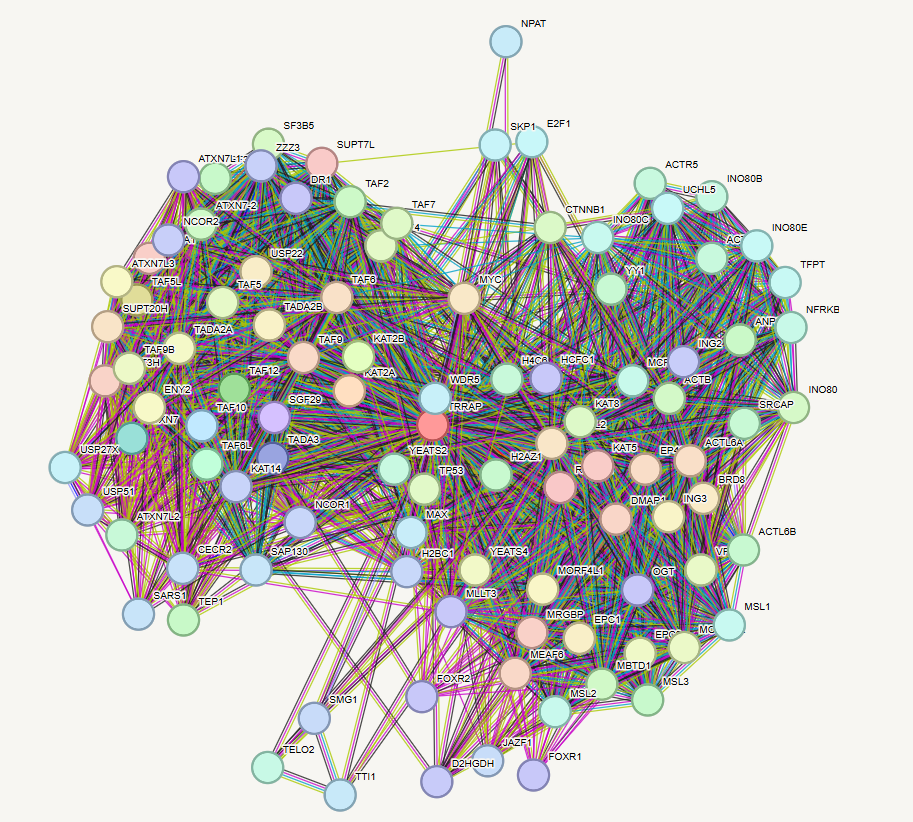

In [51]:
cat string_protein_annotations.tsv | cut -f1 | head

#node
ACTB
ACTL6A
ACTL6B
ACTR5
ACTR8
ANP32E
ATXN7
ATXN7-2
ATXN7L1


In [ ]:
cat string_protein_annotations.tsv | cut -f 1 | grep -v '#' > TRRAP-string-top.txt

In [ ]:
list=`cat TRRAP-string-top.txt`
for i in $list; do grep -w $i TRRAP-E2F-all-targets-GREAT.txt; done

This short list of genes has:

a ChIP-seq peak nearby (< 50kb)
is somehow associated with TRRAP
These are very good candidates to be TRRAP direct targets.


We can make this more lenient (find more candidates) by

allowing more distance between the peak and the target genes
allowing smaller peaks by setting the MACS2 q-value less stringent (not recommended)
fetching more associations to TRRAP in STRING

## Link Peaks to Genes

We're going to use GREAT (http://great.stanford.edu/public/html/) to link peaks to genes. GREAT also determines Gene Ontology enrichment of the linked (target) genes. 

Careful, in the advanced settings, you will see that by default, a distance of 1000kb is allowed between peak and gene. This is very far. <b>Let's try 50kb there</b>.

We start with all p53 peaks (direct and indirect). This is more general, and can also be used if there is no motif enriched (however, usually we expect the motif enriched, it's a kind of quality control). Below we will also test the direct peaks only.


Regulation of cell death and apoptotic processes are enriched in these regions, looks like it worked!

If you did that for the natural killer cells DARs, you would get immune system related processes, immune response, response to stimuli, etc.

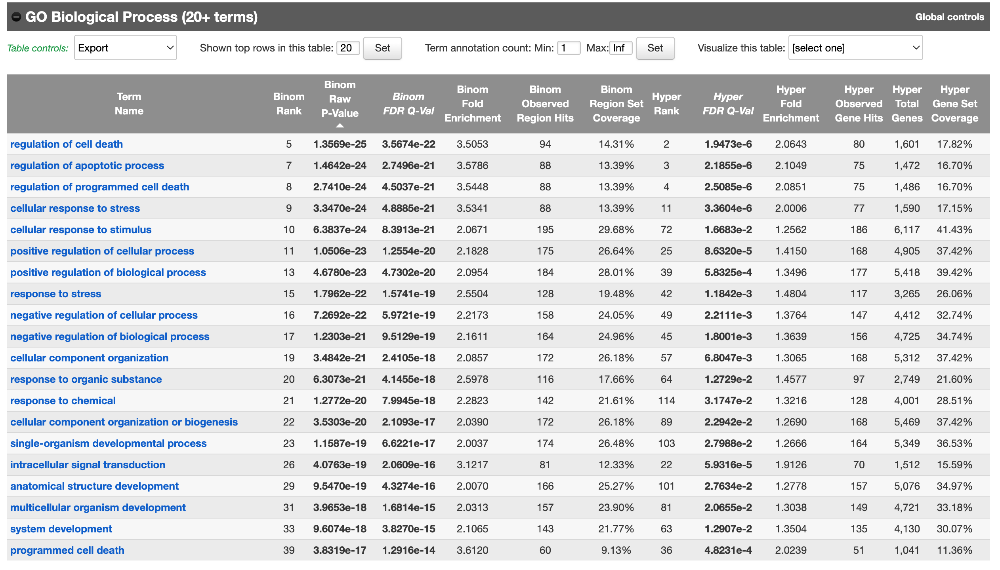

Clicking on regulation of apoptotic process, we can retrieve the peaks and the genes:

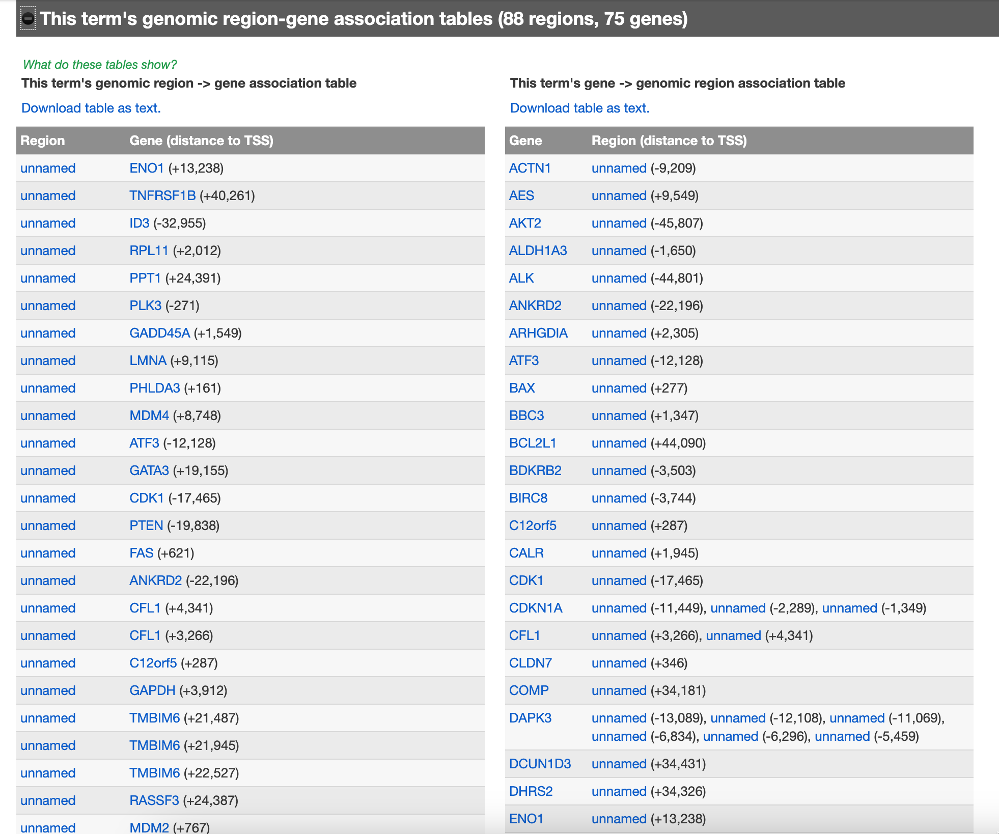

In GREAT output, in the "Job Description", we can download a table with all genes linked to all the peaks:
Copy that file to the server (to this working directory). Now we have a list of putative target genes.

In [28]:
head 20241201-public-4.0.4-SW7NtG-hg19-all-region.txt

# GREAT version 4.0.4	Species assembly: hg38	Association rule: Basal+extension: 5000 bp upstream, 1000 bp downstream, 1000000 bp max extension, curated regulatory domains included
chr17:2393724-2394074	MNT (+7219), SGSM2 (+56387)
chr2:216498645-216498995	RPL37A (+631)
chr15:82262555-82262901	SAXO2 (-83), EFL1 (+35)
chr17:36534778-36535128	PIGW (-89), MYO19 (+35)
chr2:172735772-172736120	RAPGEF4 (+105)
chr19:46416377-46416726	CCDC8 (-2968)
chr16:74368119-74368429	NPIPB15 (-9604), PSMD7 (+71499)
chr3:129893409-129893570	TRH (-80815), TMCC1 (-13024)
chr13:30307356-30307699	KATNAL1 (-44)


In [18]:
cat 20241201-public-4.0.4-SW7NtG-hg19-all-region.txt | cut -f 1 | grep -v '#' | wc -l

4696


So we have 4696 putative target genes.

In [25]:
cat 20241201-public-4.0.4-SW7NtG-hg19-all-region.txt | cut -f 1 | grep -v '#' | grep TMCC1

: 1

Good, let's save these genes into a text file

In [27]:
cat 20241201-public-4.0.4-SW7NtG-hg19-all-region.txt | cut -f 1 | grep -v '#' > TRRAP-E2F-targets-GREAT.txt

## Comparison of predicted targets with functional associations to TP53

Let's see if some more of these genes are "related" to TP53. Using https://string-db.org/ we can obtain a network of associated genes with TP53, based on genetic interactions, physical interactions, co-expression, and literature co-mentioning (in abstracts).

So let's go there, type TP53 for Human and get a maximum of 100 interactors.

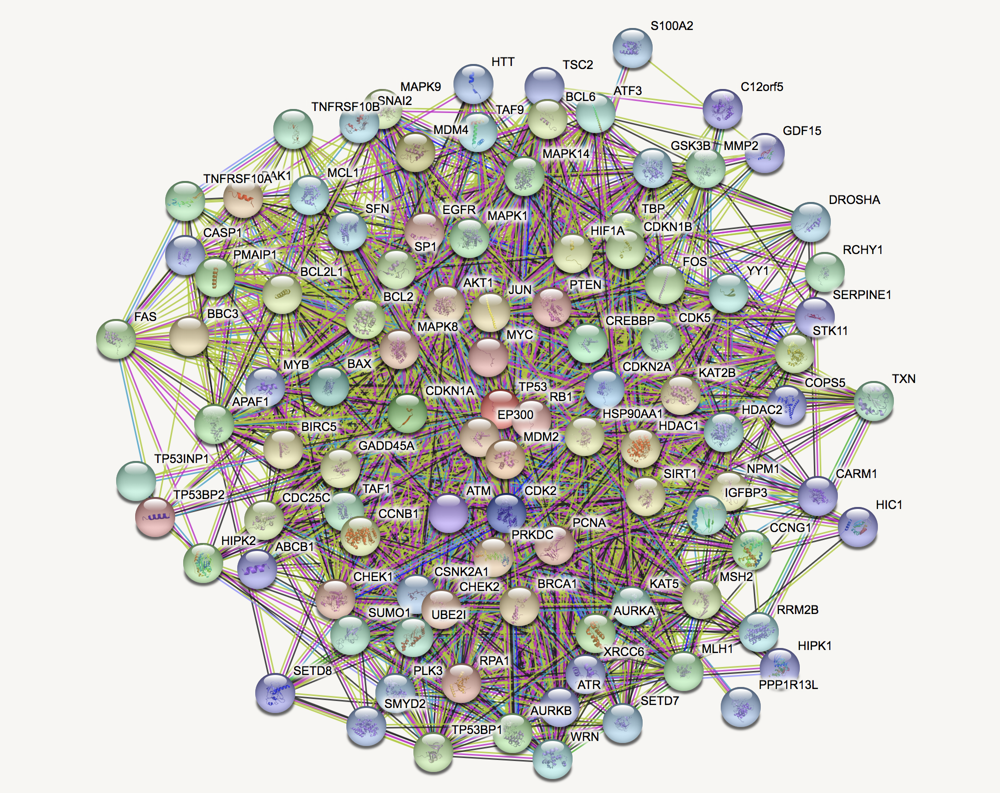

In [53]:
cat string_protein_annotations.tsv | cut -f1 | head

#node
AKT1
ATF3
ATM
ATR
AURKA
BAK1
BARD1
BAX
BCL2


In [54]:
cat string_protein_annotations.tsv | cut -f 1 | grep -v '#' > p53-string-top100.txt

In [55]:
list=`cat p53-string-top100.txt`

In [56]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done

ATF3
BAX
BCL2L1
CCNG1
CDKN1A
GADD45A
MDM2
MDM4
PTEN
RRM2B


: 1

In [57]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done > targets.txt

: 1

This short list of genes has:
* a ChIP-seq peak nearby (< 50kb)
* is somehow associated with TP53

These are very good candidates to be TP53 direct targets! (most of them are known as direct targets in fact).

We can make this more lenient (find more candidates) by 
* allowing more distance between the peak and the target genes
* allowing smaller peaks by setting the MACS2 q-value less stringent (not recommended)
* fetching more associations to TP53 in STRING

# Comparison with (sc)RNA-seq data (Optional, p53 nutlin example)

Possibly, we could test these genes in the RNA-seq data, for example by plotting a heatmap of the expresssion data for all the predicted targets. 
Or, we simply overlap these genes with the gene signature of up-regulated genes.
Or, we test this set with GSEA against the ranking of up-vs-down regulated genes.

## Using GSEA

We can use the bulk RNA-seq DESeq.tsv results. This file contain all the measured genes with their log fold change (logFC) of nutlin-3a versus control. We will sort this file by logFC, then select gene name and logFC value to generate a two-column tab-separted file, with .rnk extenstion. This is important to load the file into the GSEA tool.

In [91]:
cat /mnt/storage/data/RNA-seq/GSE47042/deseq.results.tsv | head

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
PLK1	2169.89887036599	-4.66219867916598	0.133635353659893	-34.8874646677065	1.15177059571362e-266	1.68388861093331e-262
CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
CDC20	2087.37990872435	-4.40177745450003	0.130177472157127	-33.8136651569558	1.24205653171511e-250	6.05295549789164e-247
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
CCNA2	1833.68494342593	-4.58742887189172	0.141728770920042	-32.3676614290247	7.82962634244032e-230	2.28938274252955e-226
KIF20A	2304.20076082827	-4.59980047267874	0.142632224344441	-32.2493776831997	3.58935101133231e-228	8.74605196427972e-225
HMGB2	2441.5235956432	-3.64481763157341	0.121698431532697	-29.9495859204572	4.4548629638111e-197	9.3042995044169e-194
PRC1	3467.82739378419	-3.21578273306019	0.107728899485699	-29.8506969662961	8.59778727441137e-196	1.571245

In [92]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | grep -n BBC3

92:BBC3	562.315816976695	2.59896850867815	0.203037787797711	12.8004177787217	1.63071560344179e-37	7.52083978622048e-36


In [93]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | grep -n CDKN1A

7:CDKN1A	25241.2080295721	4.4245793648994	0.129633159488639	34.131539972897	2.51260095753458e-255	1.83671129995778e-251


In [94]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | cut -f 1,3 > RNA-seq.rnk

Next, we will create a .gmt file that contains one or more gene sets. In this case one gene set, namely the set of predicted target genes based on ChIP-seq + STRING. You can also create this tab-separated file in Excel. Importantly, the first column contains the name of the set, the second column a description (we just write desc), and then all the gene names in the next columns. This .gmt file can also contain multiple gene sets, in which case they occupy different rows.

In [95]:
echo -n "targets","desc",`cat targets.txt | tr '\n' ',' ` | tr ',' '\t'

targets	desc	ATF3	BAX	BCL2L1	CCNG1	CDKN1A	GADD45A	MDM2	MDM4	PTEN	RRM2B	

In [96]:
echo -n "targets","desc",`cat targets.txt | tr '\n' ',' ` | tr ',' '\t' > targets.gmt

Now we open our local GSEA tool. We use the "Load data" button and choose both the .rnk and .gmt files to be loaded.
Next, we run GSEAPreranked, choosing the .gmt file as "Gene sets database" and the .rnk file as "ranked list". Then press "run" and when it is finished, click on the "Success". This opens a HTML file with the results. The set is significantly enriched among the top up-regulated genes! Success!

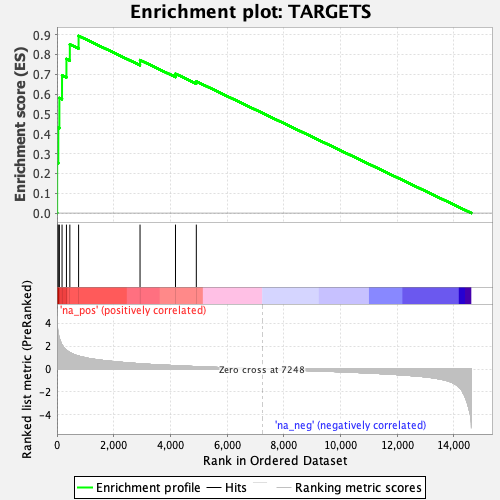

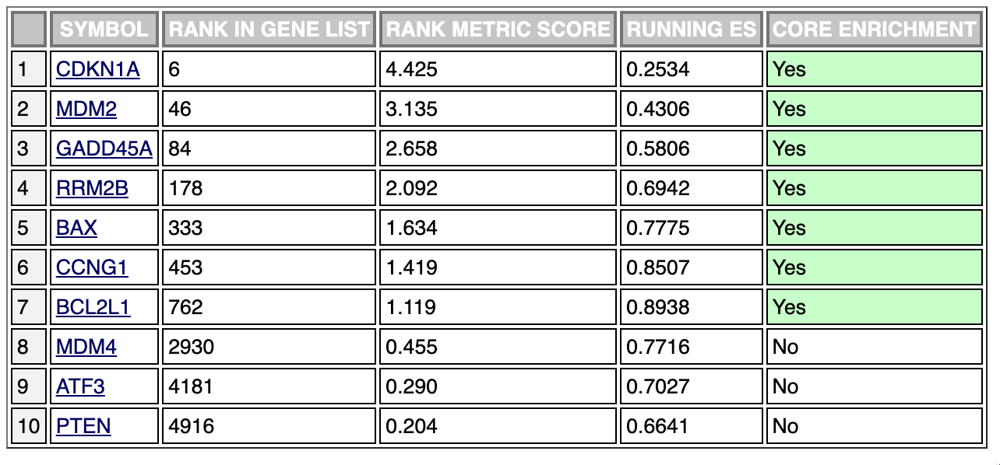

The genes in the leading edge are high-confidence targets!

* Interestingly, this also gives a good cutoff for the RNA-seq ranked gene list: the leading edge is at 762 - agrees quite well with our arbitrary cutoff of logFC > 1 and padj < 0.05 (around 800 genes)

copy-paste the list of genes in the leading edge:

CDKN1A
MDM2
GADD45A
RRM2B
BAX
CCNG1
BCL2L1

In [97]:
list='CDKN1A MDM2 GADD45A RRM2B BAX CCNG1 BCL2L1'
for i in $list; do echo "TP53,$i"; done | tr ',' '\t'

TP53	CDKN1A
TP53	MDM2
TP53	GADD45A
TP53	RRM2B
TP53	BAX
TP53	CCNG1
TP53	BCL2L1


In [98]:
for i in $list; do echo "TP53,$i"; done | tr ',' '\t' > TP53-targets.txt

Optional. 
You can load this .txt file into Cytoscape, using File -> Import -> Network from File. 
Then, select the first column as source node, and the second as target node. In Advanced Options, turn of the option "use first line as column names".

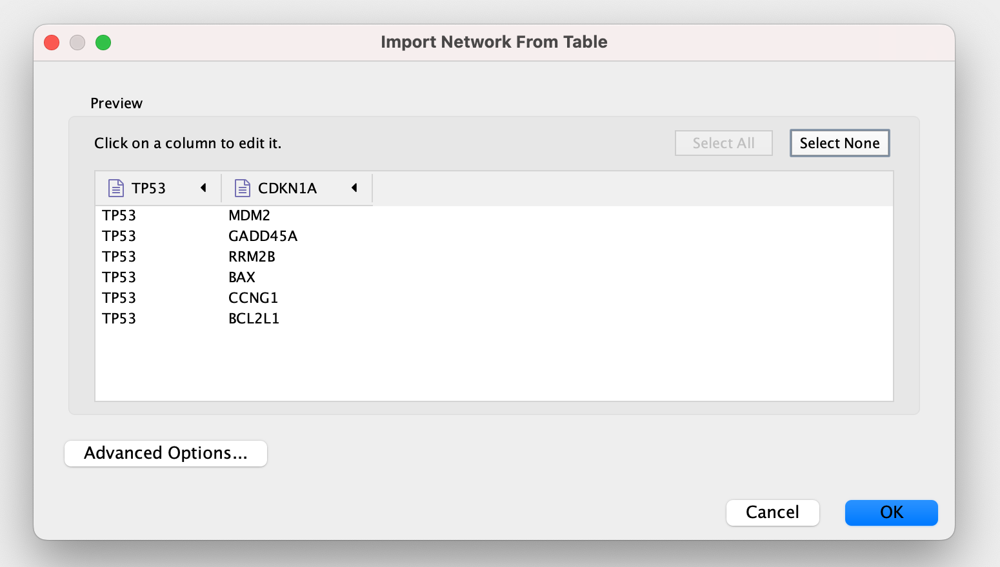

Here's our small network of high-confidence TP53 targets:

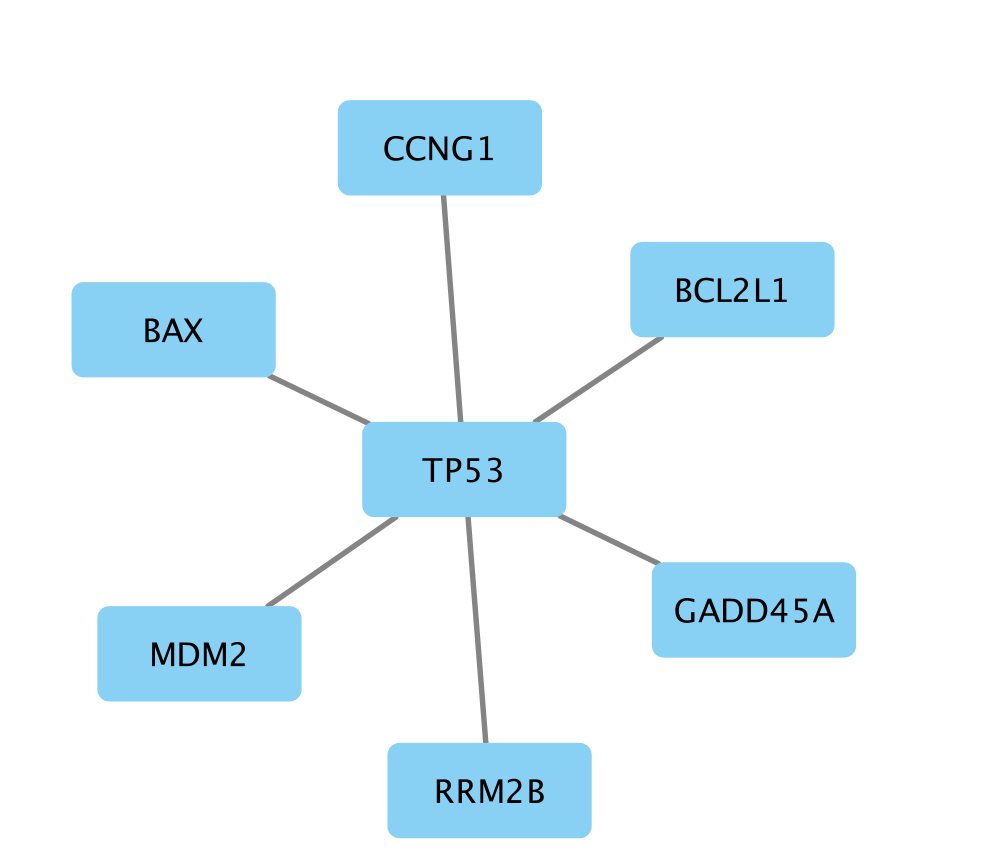

Using the Cytoscape tutorial, you can load the RNA-seq data and color the nodes by their logFC.

## GeneMania
We can repeat this process using GeneMania instead of STRING. In https://genemania.org/, enter TP53, go to "Customize advanced options" and set "maximum resultant genes" to 100. Then save the list of TP53-associated genes.

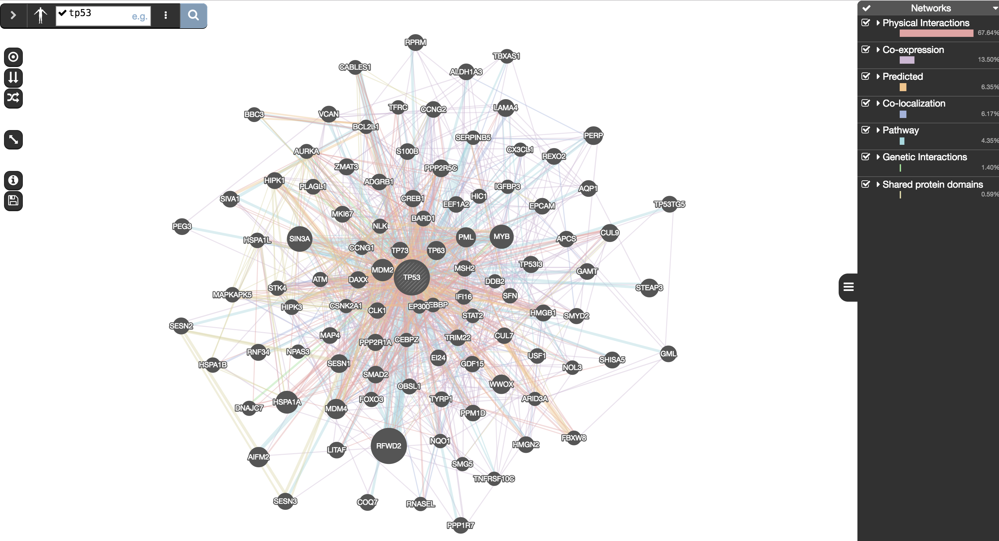

In [99]:
cat genemania-genes.txt | cut -f 1 | head

Symbol
TP53
MDM2
MYB
COP1
SIN3A
TP53BP1
TP53BP2
MDM4
TP63


In [100]:
cat genemania-genes.txt | cut -f 1 | grep -v Symbol > top100-genemania.txt

In [101]:
list=`cat top100-genemania.txt`

In [102]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done

MDM2
MDM4
PMAIP1
BBC3
STEAP3
LMNA
CCNG1
GDF15
SERPINB5
PRDM1
NQO1
DDB2
ZMAT3
PPM1D
ALDH1A3
GML


: 1

A couple of different genes are now added !

In [103]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done > p53-targets-ChIP-genemania.txt

: 1

In [104]:
echo -n "targets-genemania","desc",`cat p53-targets-ChIP-genemania.txt | tr '\n' ',' ` | tr ',' '\t'

targets-genemania	desc	MDM2	MDM4	PMAIP1	BBC3	STEAP3	LMNA	CCNG1	GDF15	SERPINB5	PRDM1	NQO1	DDB2	ZMAT3	PPM1D	ALDH1A3	GML	

In [105]:
ls -lt *.gmt

-rw-r--r-- 1 u0160030 domain users 71 Oct 28 22:04 targets.gmt


In [106]:
echo "" >> targets.gmt
echo -n "targets-genemania","desc",`cat p53-targets-ChIP-genemania.txt | tr '\n' ',' ` | tr ',' '\t' >> targets.gmt

In [107]:
cat targets.gmt

targets	desc	ATF3	BAX	BCL2L1	CCNG1	CDKN1A	GADD45A	MDM2	MDM4	PTEN	RRM2B	
targets-genemania	desc	MDM2	MDM4	PMAIP1	BBC3	STEAP3	LMNA	CCNG1	GDF15	SERPINB5	PRDM1	NQO1	DDB2	ZMAT3	PPM1D	ALDH1A3	GML	

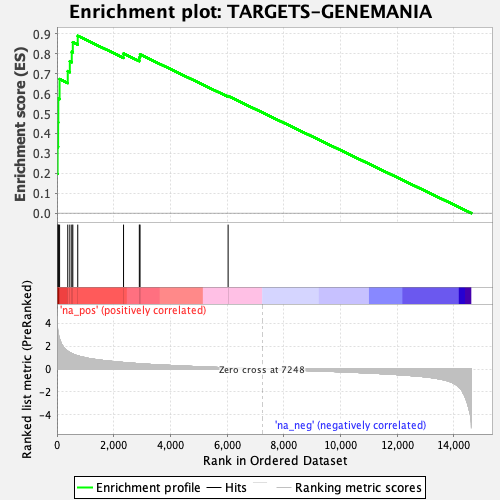

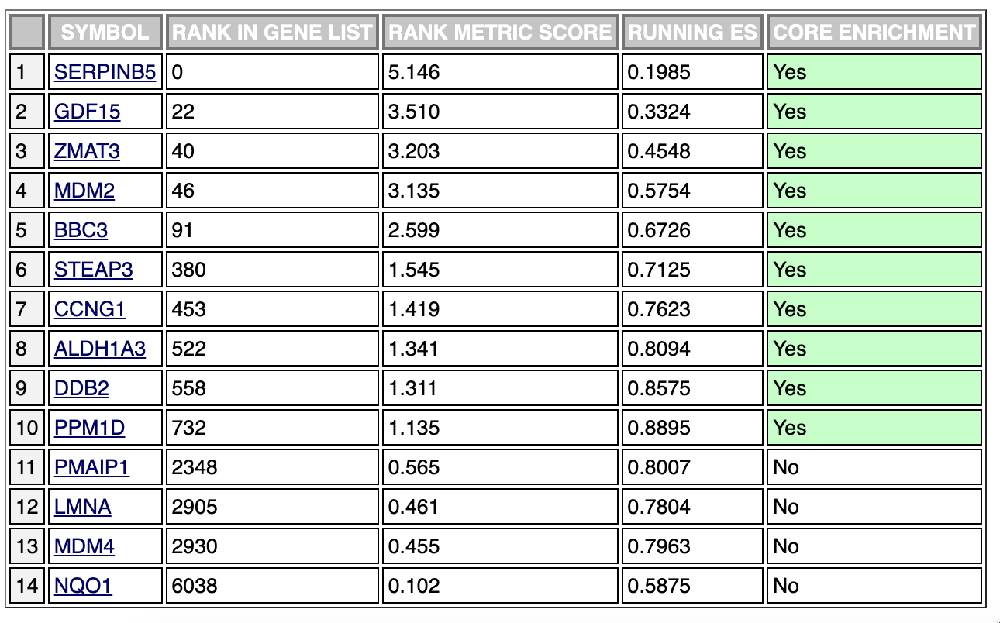

We can also do this without STRING or GeneMania "filtering", just with the entire list of ChIP-seq targets from GREAT. 


In [109]:
echo "" >> targets.gmt
echo -n "all-targets","desc",`cat TP53-targets-GREAT.txt | tr '\n' ',' ` | tr ',' '\t' >> targets.gmt

In [110]:
cat targets.gmt

targets	desc	ATF3	BAX	BCL2L1	CCNG1	CDKN1A	GADD45A	MDM2	MDM4	PTEN	RRM2B	
targets-genemania	desc	MDM2	MDM4	PMAIP1	BBC3	STEAP3	LMNA	CCNG1	GDF15	SERPINB5	PRDM1	NQO1	DDB2	ZMAT3	PPM1D	ALDH1A3	GML	
all-targets	desc	ABCA12	ABCF3	ACBD6	ACKR2	ACTA2	ACTB	ACTG1	ACTN1	ADCY9	ADNP2	ADORA2B	AEBP2	AEN	AES	AHNAK2	AKAP6	AKT2	ALDH1A3	ALDH3A1	ALK	ANKFY1	ANKRD11	ANKRD2	ANXA2R	APPBP2	ARHGDIA	ARPC1B	ART5	ATAD1	ATF3	ATG4A	ATL1	ATP5B	AVPI1	BAX	BAZ2A	BBC3	BBS12	BCL2L1	BDKRB2	BICD2	BIRC8	BTG3	BTG4	BUD31	C11orf73	C12orf44	C12orf5	C17orf82	C17orf89	C19orf33	C19orf35	C19orf47	C2CD3	C5orf55	C6orf58	C8orf22	C9orf69	CACNA1E	CALR	CAMK2G	CAP1	CAPNS1	CBX3	CCDC117	CCDC170	CCDC41	CCDC81	CCDC97	CCNG1	CD70	CDC42EP3	CDK1	CDKN1A	CEACAM21	CEP250	CEP68	CERS2	CERS5	CFL1	CHD9	CHI3L2	CHRNE	CLDN7	CLEC18B	CLEC3A	CLRN3	CNOT8	CNTN6	COBL	COMP	COX4I2	COX6B2	COX7A1	COX7A2	CP	CPN2	CPNE7	CRMP1	CTR9	CTSD	CUL1	CYP3A7	DAPK3	DCP1B	DCST2	DCUN1D3	DDB2	DDIT4	DEF8	DGAT1	DHRS2	DMRT2	DMRT3	DPH6	DRAM1	DSN1	EDA2R	EDDM3A	EDDM3B	EDN2	EEA1	EEF2	EID3	EIF4G2

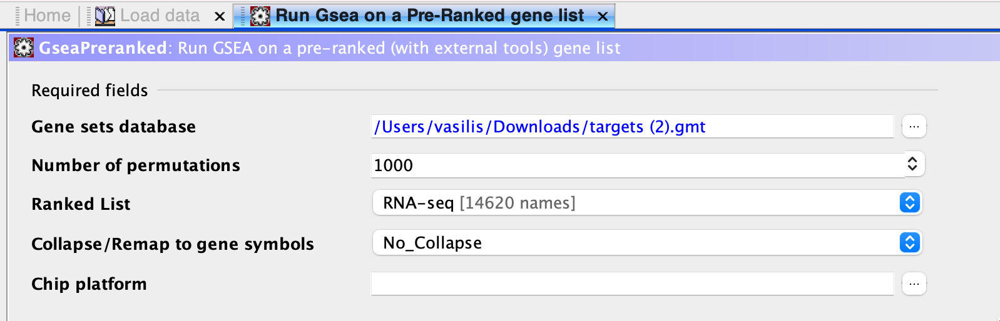

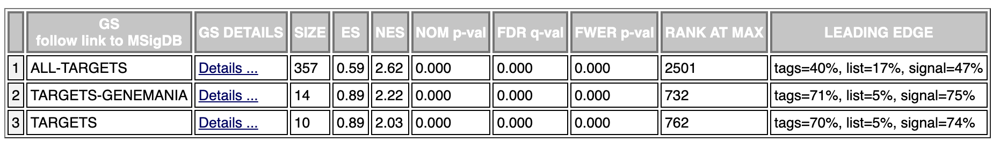

All three sets are significantly enriched in the top of the ranking (FDR < 0.001)

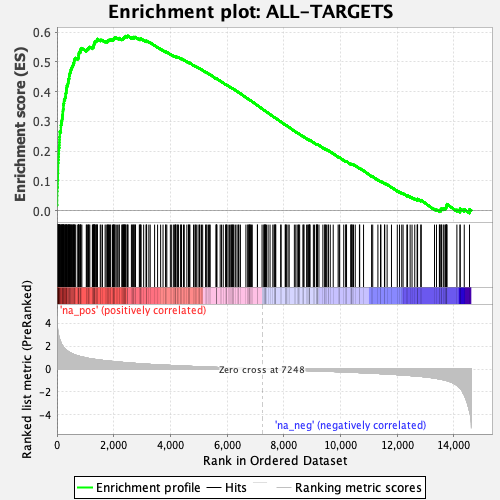

142 genes in the leading edge: high-confidence target genes of TP53.
We also observe that quite some genes with a ChIP-seq peak are not up-regulated in the RNA-seq data after nutlin-3a treatment. Either these are false positives ChIP-seq peaks, or the binding of TP53 at those locations is not functional, or the binding of TP53 does not lead to gene activation in this condition because other TFs repress those genes; or finally, the binding of TP53 may lead to gene activation, but the increased amounts of mRNA are degraded, resulting in similar steady-state levels in the RNA-seq data. To study these latter effects, we would need nascent RNA-seq (e.g., GRO-seq, PRO-seq, TT-seq, etc).

### Link Peaks to Genes using only DIRECT peaks = peaks with the TP53 motif

Above, we had downloaded the "sites" from RSAT, leading to peaks with the motif and we created a BED file with those direct peaks. Also, we downloaded the leading edge from i-cisTarget, as a BED file.

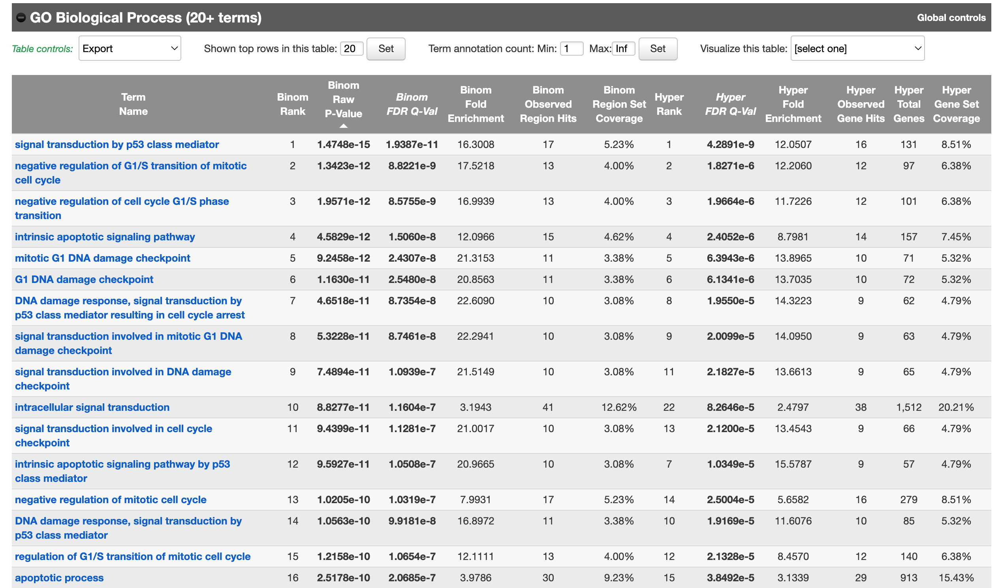

The enrichment is now much stronger !

You can repeat the GSEA analysis with the RNA-seq ranking using the direct peaks only.

In your project, if you find a good motif, with a strong enrichment like we do here, it is advisable to work mostly with the direct peaks.